In [1]:
import pandas as pd

In [2]:
### ORIGINAL DATA COMING FROM https://www.freemaptools.com/download/outcode-postcodes/postcode-outcodes.csv

outcodes = pd.read_csv('postcode-outcodes.csv').loc[:, 'postcode':]
outcodes = outcodes.loc[outcodes.latitude != 0].reset_index(drop=True)

In [3]:
%pip install haversine -qq

Note: you may need to restart the kernel to use updated packages.


In [4]:
from haversine import haversine

In [5]:
latlongs = outcodes.set_index('postcode').values

In [6]:
%%time 
distances = [[haversine(p, q) for q in latlongs] for p in latlongs]

CPU times: user 49.9 s, sys: 1.85 s, total: 51.7 s
Wall time: 1min 4s


In [7]:
%%time
distances_df = pd.DataFrame(distances, index=outcodes.postcode.tolist(), columns=outcodes.postcode.tolist())

CPU times: user 4.16 s, sys: 423 ms, total: 4.58 s
Wall time: 6.66 s


In [8]:
unstacked_distances = distances_df.unstack().reset_index()
unstacked_distances.columns = ['from', 'to', 'distance_km']
unstacked_distances = unstacked_distances.loc[unstacked_distances.distance_km < 100].reset_index(drop=True)

In [9]:
import pydata_google_auth
auth = pydata_google_auth.get_user_credentials(scopes=["https://www.googleapis.com/auth/bigquery"])

In [10]:
query = """SELECT DISTINCT postcode, forecast_live_date IS NOT NULL as is_upcoming
FROM `uw-data-models-prod.telecoms_dataform_models.tt_fttp_footprint`
"""
fttp_postcodes = pd.read_gbq(query=query, project_id='uw-data-platform-prod', 
                             credentials=auth, progress_bar_type="tqdm_notebook", use_bqstorage_api=True)

Downloading:   0%|          | 0/204284 [00:00<?, ?rows/s]

In [11]:
fttp_postcodes['outcode'] = fttp_postcodes.postcode.str.split().str[0]

In [12]:
unstacked_distances.loc[unstacked_distances['from'].isin(fttp_postcodes.outcode.drop_duplicates())]

,from,to,distance_km
0,AB10,AB10,0.000000
1,AB10,AB11,1.643896
2,AB10,AB12,3.817751
3,AB10,AB13,7.871741
4,AB10,AB14,10.019769
...,...,...,...
1236335,E20,SS99,43.281542
1236336,E20,SW99,10.088506
1236337,E20,UB18,27.058048
1236338,E20,E20,0.000000


In [13]:
p_query = f"""SELECT partner_position_id 
FROM `uw-partner-prod.metrics_analysis.partner_position_master_data_current`
WHERE is_live AND customers_gathered_last_1y > 0
"""

partner_cohort = pd.read_gbq(query=p_query, project_id='uw-data-platform-prod', 
                             credentials=auth, progress_bar_type="tqdm_notebook", use_bqstorage_api=True)

Downloading:   0%|          | 0/13421 [00:00<?, ?rows/s]

In [14]:
partner_postcodes_q = """SELECT partner_position_id
        ,UPPER(partner.address.post_code) AS postcode, 
  FROM `uw-partner-prod.position_v1.partner_position_ownership_changed_latest` owner
  LEFT JOIN `uw-partner-prod.partner_v1.partner_details_changed_latest` details
  ON owner.owner_id = details.partner_id
  ,UNNEST (partner.address.lines) AS address_lines
  GROUP BY 1, 2"""

partner_postcodes = pd.read_gbq(query=partner_postcodes_q, project_id='uw-data-platform-prod', 
                             credentials=auth, progress_bar_type="tqdm_notebook", use_bqstorage_api=True)

Downloading:   0%|          | 0/211799 [00:00<?, ?rows/s]

In [15]:
partner_postcodes['outcode'] = partner_postcodes.postcode.str.upper().str.split().str[0]

In [16]:
partner_postcodes = (partner_postcodes.loc[partner_postcodes.partner_position_id
                      .isin(partner_cohort.partner_position_id)]
 .dropna()
 .reset_index(drop=True)
)

In [17]:
partner_outcodes = partner_postcodes.groupby('outcode').agg(list)[['partner_position_id']]

In [18]:
distance_ranking = (unstacked_distances
                    .loc[unstacked_distances['from']
                         .isin(fttp_postcodes.outcode.drop_duplicates())]
                    .join(partner_outcodes, on='to').dropna())

In [19]:
distance_ranking.sort_values(['from', 'distance_km']).reset_index(drop=True)

,from,to,distance_km,partner_position_id
0,AB10,AB10,0.000000,"[AB0436, AA4842, N67078, AA2454]"
1,AB10,AB11,1.643896,"[AA7504, AB1101, N83503, AA1535]"
2,AB10,AB25,2.019922,[AB5021]
3,AB10,AB15,2.919272,[N66675]
4,AB10,AB24,3.095011,"[AA9846, N12445, AA8591]"
...,...,...,...,...
882300,YO8,ST13,98.846288,"[E18080, E74021, N20733, B12828, L10026, AA278..."
882301,YO8,DL5,98.900493,"[AA7244, B67973, 756763, AB1016, AA7530, 07276..."
882302,YO8,NG10,99.116736,"[AB1030, N52802, N77258, N25525, AA3955, N7370..."
882303,YO8,BL5,99.414228,"[AA2806, N66249, N74037, N83836, N75592, AA9930]"


In [20]:
_res = []
for r in distance_ranking.to_dict(orient='records'):
    _res += [{'fttp_outcode': r['from'], 'partner_outcode': r['to'], 
              'distance_km': r['distance_km'], 'partner_position_id': p} for p in r['partner_position_id']]
    
normalised_distances = pd.DataFrame(_res)

In [21]:
normalised_distances

,fttp_outcode,partner_outcode,distance_km,partner_position_id
0,AB10,AB10,0.000000,AB0436
1,AB10,AB10,0.000000,AA4842
2,AB10,AB10,0.000000,N67078
3,AB10,AB10,0.000000,AA2454
4,AB10,AB11,1.643896,AA7504
...,...,...,...,...
5559584,E20,WD6,22.186793,AA6558
5559585,E20,WD6,22.186793,K96956
5559586,E20,WD6,22.186793,N60769
5559587,E20,WD6,22.186793,AB1600


In [22]:
rfm_query = """WITH raw_values as (

SELECT 
partner_position_id,
CASE 
WHEN title = '1D' THEN 'group_1' 
WHEN title IN ('2QD', '3TL', '4STL') THEN 'group_2'
WHEN title IN ('5GL', '6SGL', '8NNL', '7NGL') THEN 'group_3'
ELSE NULL END as title_group,
days_since_last_activity as recency,
customers_gathered_last_1y as frequency,
times_successfully_supporting_last_1y as leadership,
partner_value_last_1y as value

FROM `uw-partner-prod.metrics_analysis.partner_position_master_data_current` 
INNER JOIN `uw-partner-prod.lifetime_value.partner_last_year_value_current`  USING(partner_position_id)
WHERE is_live)

, thresholds as 
(
SELECT 'group_1' as title_group,
[-295, -218, -145, -67] as recency_thresholds,
[1, 2, 3, 6] as frequency_thresholds,
[3, 10, 17, 25, 40] as value_thresholds,
[0, 1] as leadership_thresholds
UNION ALL
SELECT 'group_2' as title_group,
[-295, -210, -135, -61] as recency_thresholds,
[6, 17, 38, 94] as frequency_thresholds,
[38, 104, 220, 415, 913] as value_thresholds,
[8, 33] as leadership_thresholds
UNION ALL
SELECT 'group_3' as title_group,
[-254, -173, -90, -27] as recency_thresholds,
[8, 22, 41, 69] as frequency_thresholds,
[38, 110, 212, 332, 505] as value_thresholds,
[18, 61] as leadership_thresholds
)

, scores as (
SELECT 
*,
CAST(REGEXP_EXTRACT(ML.BUCKETIZE(-recency, recency_thresholds) , '[0-9]') as INT64) -1 as recency_score,
CAST(REGEXP_EXTRACT(ML.BUCKETIZE(frequency, frequency_thresholds) , '[0-9]') as INT64) -1 as frequency_score,
CAST(REGEXP_EXTRACT(ML.BUCKETIZE(value, value_thresholds) , '[0-9]') as INT64) -1 as value_score,
CAST(REGEXP_EXTRACT(ML.BUCKETIZE(leadership, leadership_thresholds ) , '[0-9]') as INT64) -1 as leadership_score,

FROM raw_values 
INNER JOIN thresholds USING(title_group))

SELECT 
partner_position_id, 
title_group,
recency_score,
frequency_score,
value_score,
recency_score + frequency_score + value_score as rfm_score,
FROM scores"""

rfm_scores = pd.read_gbq(query=rfm_query, project_id='uw-data-platform-prod', 
                             credentials=auth, progress_bar_type="tqdm_notebook", use_bqstorage_api=True)

Downloading:   0%|          | 0/47235 [00:00<?, ?rows/s]

In [23]:
normalised_distances = normalised_distances.join(rfm_scores.set_index('partner_position_id'), 
                                                 on='partner_position_id', how='inner')

In [24]:
caci_query = """WITH scores as (
SELECT 
REGEXP_EXTRACT(UPPER(postcode), '^[^ ]*') as outcode, 
AVG(CASE WHEN a_lukp_netfreq10p THEN 1 ELSE 0 END) as high_internet_usage, 
AVG(CASE WHEN a_ips_intaddict THEN 1 ELSE 0 END ) as internet_addict,
AVG(ips_onlinegames) as online_games,
AVG(ips_tvfilmsonline) as online_films,
COUNT(DISTINCT(UPPER(postcode))) as postcodes_covered
FROM `uw-data-warehouse-dev.data_science_caci_ocean.ocean_customer` 
GROUP BY 1 )

SELECT 
outcode, postcodes_covered,
high_internet_usage + internet_addict + online_games + online_films as internet_score
FROM scores"""

internet_scores = pd.read_gbq(query=caci_query, project_id='uw-data-platform-prod', 
                             credentials=auth, progress_bar_type="tqdm_notebook", use_bqstorage_api=True)

Downloading:   0%|          | 0/2818 [00:00<?, ?rows/s]

In [25]:
normalised_distances = normalised_distances.join(internet_scores.set_index('outcode'), on='fttp_outcode')

<AxesSubplot:>

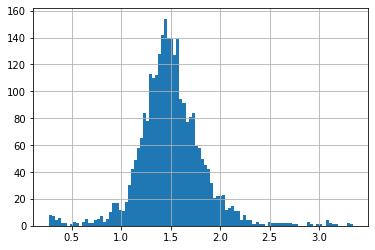

In [26]:
internet_scores.internet_score.hist(bins=100)

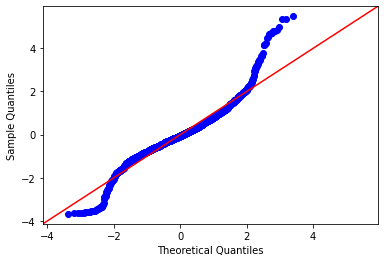

In [27]:
import statsmodels.api as sm
sm.qqplot(internet_scores.internet_score.dropna(), 
          line='45', fit=True);

In [32]:
(normalised_distances.loc[(normalised_distances.rfm_score >= 7) 
                         & (normalised_distances.distance_km <= 100)]
 .join(fttp_postcodes.set_index('outcode'), on='fttp_outcode', how='right')
.isna().sum())

fttp_outcode               0
partner_outcode          365
distance_km              365
partner_position_id      365
title_group              365
recency_score            365
frequency_score          365
value_score              365
rfm_score                365
postcodes_covered      23862
internet_score         36714
postcode                   0
is_upcoming                0
dtype: int64

In [33]:
filtered_data = (normalised_distances.loc[(normalised_distances.rfm_score >= 10) 
                         & (normalised_distances.distance_km <= 10)]
 .join(fttp_postcodes.set_index('outcode'), on='fttp_outcode', how='right'))

In [34]:
all_postcodes = pd.read_csv('ukpostcodes.csv')

In [35]:
all_postcodes['outcode'] = all_postcodes.postcode.str.split().str[0]

In [36]:
outcodes = outcodes.join(all_postcodes.groupby('outcode')['postcode'].count(), on='postcode', 
                         how='left', rsuffix='_count')

In [37]:
fttp_data = (filtered_data.loc[:, ['fttp_outcode', 'internet_score', 'postcodes_covered']]
 .drop_duplicates()
 .join(outcodes.set_index('postcode'), 
       on='fttp_outcode', how='inner')
.reset_index(drop=True)
 .join(fttp_postcodes.groupby('outcode').count(), on='fttp_outcode', how='left'))

In [38]:
fttp_data['internet_score_coverage'] = fttp_data['postcodes_covered'] / fttp_data['postcode_count']

In [39]:
%pip install folium -qq

Note: you may need to restart the kernel to use updated packages.


In [40]:
partner_data = (filtered_data.loc[:, ['partner_position_id', 'rfm_score']]
 .join(partner_postcodes.set_index('partner_position_id')['postcode'], on='partner_position_id', how='left')
 .join(all_postcodes.set_index('postcode').loc[:, ['latitude', 'longitude']], on='postcode', how='left')
                .drop_duplicates()
)

In [41]:
fttp_data['desirability'] = pd.qcut(fttp_data.internet_score, q=[0, 1/3, 2/3, 1.], labels=['Low', 'Mid', 'High'])

In [42]:
fttp_data['normalised_coverage'] = fttp_data.internet_score_coverage / fttp_data.internet_score_coverage.max()
fttp_data['coverage_bins'] = pd.qcut(fttp_data.normalised_coverage, q=[0, 1/3, 2/3, 1.], labels=['Low', 'Mid', 'High'])

In [46]:
fttp_postcodes.is_upcoming.mean()

0.022689001586027296

In [47]:
fttp_pcode_heatmapdata = fttp_postcodes.loc[fttp_postcodes.is_upcoming].join(all_postcodes.set_index('postcode').loc[:, ['latitude', 'longitude']], 
                    on='postcode', how='inner').loc[:, ['latitude', 'longitude']].values

fttp_live_pcode_hmdata = fttp_postcodes.loc[~fttp_postcodes.is_upcoming].join(all_postcodes.set_index('postcode').loc[:, ['latitude', 'longitude']], 
                    on='postcode', how='inner').loc[:, ['latitude', 'longitude']].values

In [48]:
import folium
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap


In [61]:
# Bounds
min_lat, max_lat = 48.77, 60
min_lon, max_lon = -9.05, 5

m = folium.Map(location=[53.884797 , -3.438721],
               tiles='Stamen Terrain', 
               zoom_start=6,
               min_lat=min_lat, 
               max_lat=max_lat,
               min_lon=min_lon, 
               max_lon=max_lon,
               max_zoom=18, 
               min_zoom=5)

fttp_outcodes_feature_group = folium.FeatureGroup(name='FTTP outcodes').add_to(m)
fttp_feature_group = folium.FeatureGroup(name='FTTP upcoming postcodes').add_to(m)
fttp_live_feature_group = folium.FeatureGroup(name='FTTP live postcodes').add_to(m)

circle_colours = {'Low': 'red', 'Mid': 'yellow', 'High': 'green'}

for pc in fttp_data.to_dict(orient='records'):
    popup = folium.Tooltip(f"""{pc['fttp_outcode']}<br>Postcodes: {pc['postcode']}
    <br>Internet Score: {round(pc['internet_score'], 2)} ({pc['desirability']})
    <br>CACI confidence: {round(pc['internet_score_coverage'], 2)} ({pc['coverage_bins']})""")
    marker = folium.Circle(location=(pc['latitude'], pc['longitude']), radius=5_000,
                           tooltip=popup, fill=True, 
                           color=circle_colours.get(pc['desirability']),
                          fill_opacity=pc['normalised_coverage'] * .6, opacity=pc['normalised_coverage']).add_to(m)
    marker.add_to(fttp_outcodes_feature_group)
    
heatmap = HeatMap(fttp_pcode_heatmapdata, radius=25, control=False).add_to(m)
heatmap.add_to(fttp_feature_group);

heatmap = HeatMap(fttp_live_pcode_hmdata, radius=25, control=False).add_to(m)
heatmap.add_to(fttp_live_feature_group);

In [62]:
partners_feature_group = folium.FeatureGroup(name='Partners').add_to(m)

partner_cluster =  MarkerCluster(control=False).add_to(m)
partner_cluster.add_to(partners_feature_group)

for pc in partner_data.loc[partner_data.latitude.notna()].to_dict(orient='records'):
    popup = folium.Popup(f"{pc['partner_position_id']}<br>Postcode: {pc['postcode']}<br>RFM: {round(pc['rfm_score'], 2)}")
    icon = folium.map.Icon(color='darkpurple')
    marker = folium.Marker(location=(pc['latitude'], pc['longitude']), 
                           clustered_marker=True, popup=popup, icon=icon).add_to(partner_cluster)


In [63]:
folium.LayerControl().add_to(m)
m

In [64]:
m.save('fttp_map_with_live.html')